In [1]:
import pickle
import torch
import numpy as np
import pandas as pd
import os 
import matplotlib.pyplot as plt
from ipywidgets import interact, IntSlider
from PIL import Image
import json
from tqdm import tqdm

In [2]:
import os
import platform
if platform.system() == 'Darwin':
    DATA_PATH = "/Users/maltegenschow/Documents/Uni/Thesis/Data.nosync"
    ROOT_PATH = "/Users/maltegenschow/Documents/Uni/Thesis/Thesis"
elif platform.system() == 'Linux':
    DATA_PATH = "/pfs/work7/workspace/scratch/tu_zxmav84-thesis/Data.nosync"
    ROOT_PATH = "/pfs/work7/workspace/scratch/tu_zxmav84-thesis/Thesis"

current_wd = os.getcwd()

inversion_save_path = f"{DATA_PATH}/Models/e4e/00005_snapshot_1200/inversions/" 
generatot_path = f"{DATA_PATH}/Models/Stylegan2_Ada/Experiments/00005-stylegan2_ada_images-mirror-auto2-kimg5000-resumeffhq512/network-snapshot-001200.pkl"

In [3]:
try:
    if torch.cuda.is_available():
        device = 'cuda'
    elif torch.backends.mps.is_available():
        device = 'mps'
    else:
        device = 'cpu'
except:
    if torch.cuda.is_available():
        device = 'cuda'
    else:
        device = 'cpu'
print(f"Using {device} as device")

Using cuda as device


## Setup

In [4]:
# Load in metadata
metadata = json.load(open(f"{DATA_PATH}/Zalando_Germany_Dataset/dresses/metadata/dresses_metadata.json", 'r'))
metadata_df = pd.read_json(f"{DATA_PATH}/Zalando_Germany_Dataset/dresses/metadata/dresses_metadata.json").T.reset_index().rename(columns={'index':'id'})

In [5]:
# Load in latents and file paths
latents = torch.load(f"{inversion_save_path}latents.pt")
with open(f"{inversion_save_path}file_paths.pkl", 'rb') as f:
    file_paths = pickle.load(f)

latents_dict = {}
for i, file in enumerate(file_paths):
    sku = file.split('/')[-1].split('_')[-1].split('.')[0]
    latents_dict[sku] = latents[i]

In [6]:
# Initalize original custom SG2-Ada generator
os.chdir(f"{ROOT_PATH}/stylegan2-ada-pytorch/")

with open(generatot_path, 'rb') as f:
    architecture = pickle.load(f)
    G = architecture['G_ema'].to(device)  # torch.nn.Module 
    if torch.device == 'cpu':
        G = G.to(torch.float32)
    D = architecture['D'].to(device)

os.chdir(f'{ROOT_PATH}/2_Inversion/e4e/')

In [7]:
def generate_from_sku(sku):
    latent = latents_dict[sku][0].unsqueeze(0).to(device)
    img = G.synthesis(latent, force_fp32=True)
    img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    img = Image.fromarray(img[0].cpu().numpy(), 'RGB')
    return img

def generate_from_latent(latent):
    img = G.synthesis(latent, force_fp32=True)
    img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    img = Image.fromarray(img[0].cpu().numpy(), 'RGB')
    return img

## Reconstructions

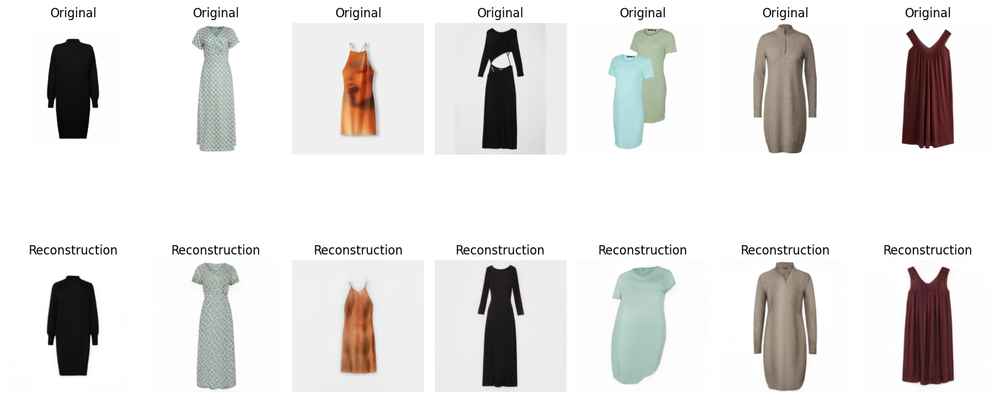

In [8]:
num_samples = 7

image_path = f"{DATA_PATH}/Zalando_Germany_Dataset/dresses/images/square_images/"
samples = np.random.choice(list(latents_dict.keys()), num_samples)

fig, ax = plt.subplots(2, num_samples, figsize=(num_samples*2, 8))

for i, sku in enumerate(samples): 
    # Reconstruction
    img = generate_from_sku(sku)

    # Original 
    img_orig = Image.open(f"{image_path}{sku}.jpg").resize([512, 512])

    ax[0, i].imshow(img_orig)
    ax[0, i].axis('off')
    ax[0, i].set_title(f"Original")

    ax[1, i].imshow(img)
    ax[1, i].axis('off')
    ax[1, i].set_title(f"Reconstruction")

fig.tight_layout()
plt.show()

## Interpolations

In [9]:
def get_interpolations(w1, w2, num_intermediates = 10):
    # Linearly interpolate between w1 and w2
    interpolated_tensors = []
    for i in range(num_intermediates + 2):  # including w1 and w2
        alpha = i / (num_intermediates + 1)
        interpolated_tensor = torch.lerp(w1, w2, alpha)
        interpolated_tensors.append(interpolated_tensor)

    # Generate images
    imgs = []
    for tensor in tqdm(interpolated_tensors, desc='Generating images'):
        img = generate_from_latent(tensor)
        imgs.append(img)
    
    return imgs

def show_image(idx):
    plt.figure(figsize=(8, 8))
    plt.imshow(imgs[idx])
    plt.axis('off')
    plt.show()

In [10]:
samples = np.random.choice(list(latents_dict.keys()), 2)

w1 = latents_dict[samples[0]][0].unsqueeze(0).to(device)
w2 = latents_dict[samples[1]][0].unsqueeze(0).to(device)

imgs = get_interpolations(w1, w2, num_intermediates=20)
num_images = len(imgs)
interact(show_image, idx=IntSlider(min=0, max=num_images-1, step=1, value=0))
plt.show()

Generating images: 100%|██████████| 22/22 [00:00<00:00, 23.52it/s]


interactive(children=(IntSlider(value=0, description='idx', max=21), Output()), _dom_classes=('widget-interact…

## Average Latents

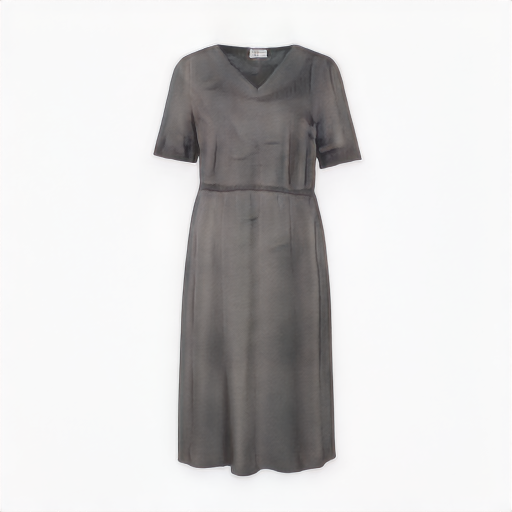

In [11]:
avg_latent = torch.mean(latents, dim=0)[0].unsqueeze(0).to(device)
img_avg = generate_from_latent(avg_latent)
img_avg

In [12]:
category_lists = {}
for garmen_type in metadata_df['garment_type'].unique():
    sub = metadata_df[metadata_df['garment_type'] == garmen_type]
    category_lists[garmen_type] = sub.id.to_list()

# Calculate average latent for each category
avg_latents = {}
for category, skus in category_lists.items():
    latents = [latents_dict[sku][0] for sku in skus]
    print(f"Category: {category}, Number of items: {len(latents)}")
    avg_latent = torch.mean(torch.stack(latents), dim=0).unsqueeze(0).to(device)
    avg_latents[category] = avg_latent

Category: jersey_dresses, Number of items: 2133
Category: shift_dresses, Number of items: 1100
Category: occasion_dresses, Number of items: 755
Category: evening_dresses, Number of items: 1634
Category: knitted_dresses, Number of items: 1525
Category: casual_dresses, Number of items: 5193
Category: denim_dresses, Number of items: 314
Category: maxi_dresses, Number of items: 1406


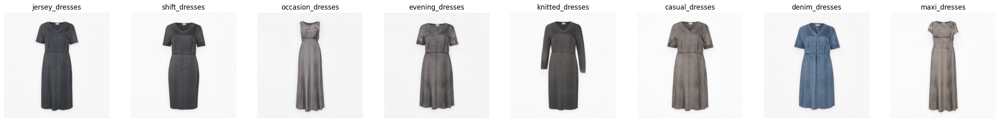

In [13]:
# Plot average latents
fig, ax = plt.subplots(1, len(avg_latents), figsize=(len(avg_latents)*4, 4))
for i, (category, avg_latent) in enumerate(avg_latents.items()):
    img = generate_from_latent(avg_latent)
    ax[i].imshow(img)
    ax[i].axis('off')
    ax[i].set_title(category)

## Nearest/Farthest Neighbors

100%|██████████| 14060/14060 [00:00<00:00, 14655.86it/s]


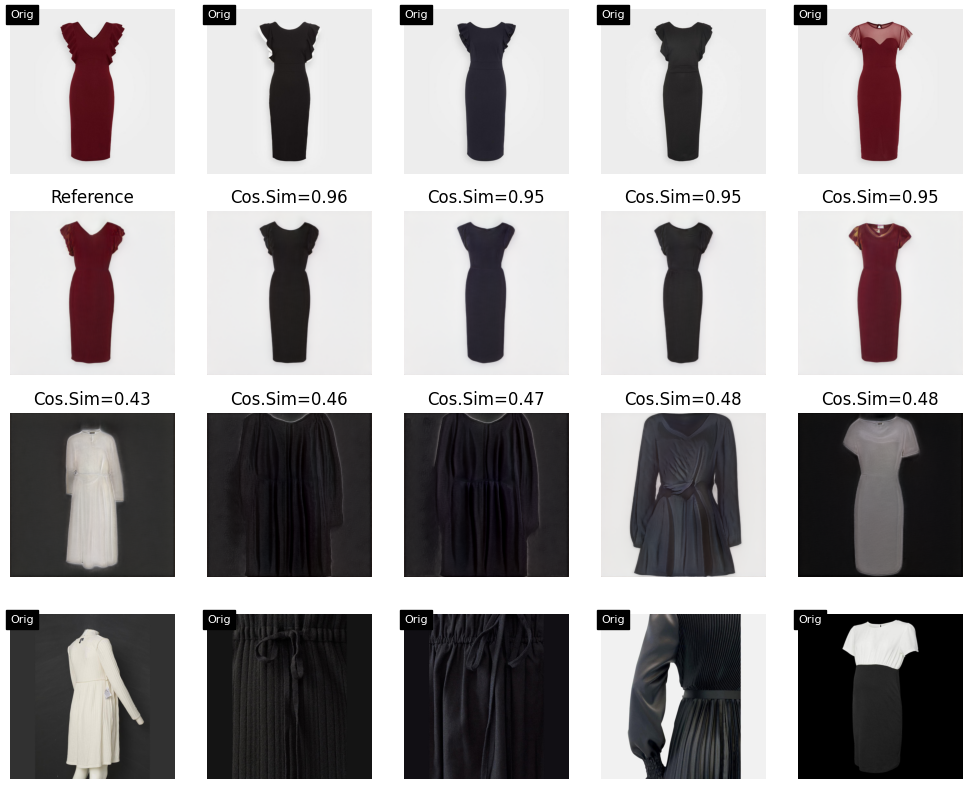

In [14]:
# Draw random sample
sample = np.random.choice(list(latents_dict.keys()))

# Caluclate distances to every other item using cosine similarity
distances = {}
for sku, latent in tqdm(latents_dict.items()):
    distance = torch.nn.functional.cosine_similarity(latents_dict[sample].reshape(1,-1), latent.reshape(1,-1))
    distances[sku] = distance.item()
distances = pd.Series(distances)

# Plot most similar and most dissimilar items
num_comparisons = 5
fig, ax = plt.subplots(4, num_comparisons, figsize=(num_comparisons*2, 8))
for i, sku in enumerate(distances.nlargest(num_comparisons).index):
    # Reference
    img = generate_from_sku(sku)
    ax[1, i].imshow(img)
    ax[1, i].axis('off')
    if i == 0:
        ax[1, i].set_title(f"Reference")
    else:
        ax[1, i].set_title(f"Cos.Sim={np.round(distances[sku], 2)}")
    
    # Orignal Image
    img_orig = Image.open(f"{image_path}{sku}.jpg").resize([512, 512])
    ax[0, i].imshow(img_orig)
    ax[0, i].axis('off')
    ax[0, i].text(0, 0, 'Orig', color='white', backgroundcolor='black', fontsize=8, verticalalignment='top')

for i, sku in enumerate(distances.nsmallest(num_comparisons).index):
    img = generate_from_sku(sku)
    ax[2, i].imshow(img)
    ax[2, i].axis('off')
    ax[2, i].set_title(f"Cos.Sim={np.round(distances[sku], 2)}")

    # Orignal Image
    img_orig = Image.open(f"{image_path}{sku}.jpg").resize([512, 512])
    ax[3, i].imshow(img_orig)
    ax[3, i].axis('off')
    ax[3, i].text(0, 0, 'Orig', color='white', backgroundcolor='black', fontsize=8, verticalalignment='top')

fig.tight_layout()
plt.show()

## Attribute Manipulations

In [15]:
# Get manipulation directions for a given attribute
def get_directions(attribute):
    unique_values = [elem for elem in metadata_df[attribute].unique() if elem != None]
    # Calculate mean latent for each value of the attribute
    mean_latents = {}
    for value in unique_values:
        skus = metadata_df[metadata_df[attribute] == value].id.to_list()
        latents = [latents_dict[sku][0] for sku in skus]
        mean_latent = torch.mean(torch.stack(latents), dim=0).unsqueeze(0).to(device)
        mean_latents[value] = mean_latent
    
    # Calculate directions by substracting mean latents from each other
    directions = {}
    for value1 in unique_values:
        for value2 in unique_values:
            if value1 != value2:
                direction = mean_latents[value2] - mean_latents[value1]
                directions[(value1, value2)] = direction 

    return directions

def change_attribute(latent, directions, from_value, to_value, alpha=1):
    direction = directions[(from_value, to_value)]
    new_latent_vector = latent + alpha * direction
    return new_latent_vector

In [16]:
def plot_attribute_changes(attribute, num_samples=5, alpha=1):
    # Get directions
    directions = get_directions(attribute)

    # Plot manipulations
    unique_values = [elem for elem in metadata_df[attribute].unique() if elem != None]
    fig, ax = plt.subplots(num_samples, len(unique_values)+2, figsize=(len(unique_values)*2, num_samples*2))
    # Loop over multiple samples
    for sample in range(num_samples):
        sku = metadata_df[metadata_df[attribute].notnull()].sample(1).id.values[0]
        # Original Image
        img_orig = Image.open(f"{image_path}{sku}.jpg").resize([512, 512])
        ax[sample, 0].imshow(img_orig)
        ax[sample, 0].axis('off')
        ax[sample, 0].set_title(f"Orig: {metadata[sku][attribute]}")

        # Reconstruction
        img = generate_from_sku(sku)
        ax[sample, 1].imshow(img)
        ax[sample, 1].axis('off')
        ax[sample, 1].set_title(f"Recon: {metadata[sku][attribute]}")

        # Change attribute
        latent = latents_dict[sku][0].unsqueeze(0).to(device)
        for i, value in enumerate(unique_values):
            if value == metadata[sku][attribute]:
                ax[sample, i+2].axis('off')
                continue
            else:
                new_latent = change_attribute(latent, directions, metadata[sku][attribute], value, alpha=alpha)
                img = generate_from_latent(new_latent)
                ax[sample, i+2].imshow(img)
                ax[sample, i+2].axis('off')
                ax[sample, i+2].set_title(value)
    fig.tight_layout()
    plt.show()

### Color

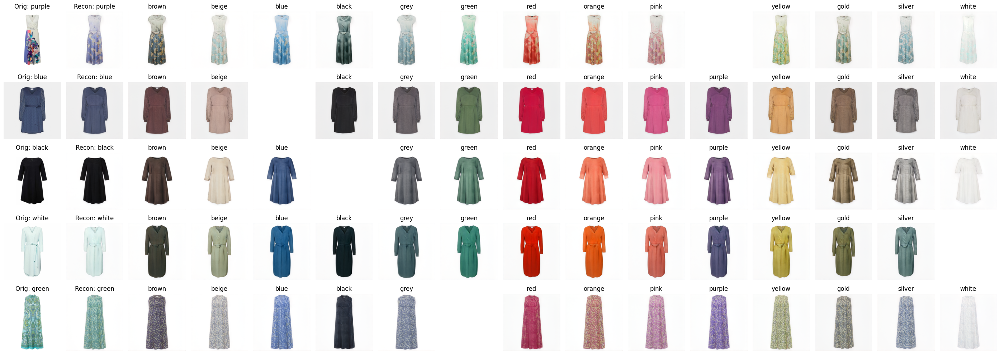

In [17]:
plot_attribute_changes('color')

### Neckline

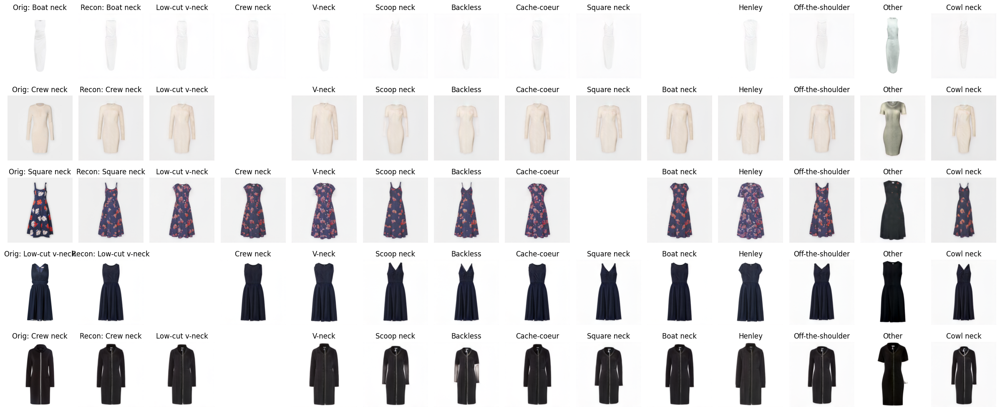

In [18]:
plot_attribute_changes('neckline')

### Pattern

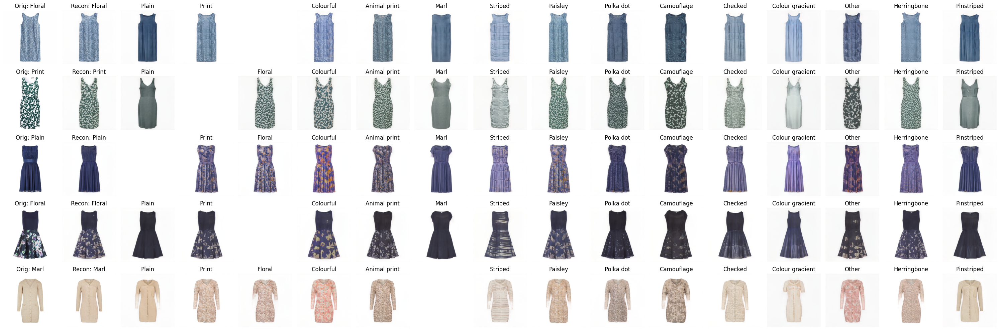

In [19]:
plot_attribute_changes('pattern')

### Length

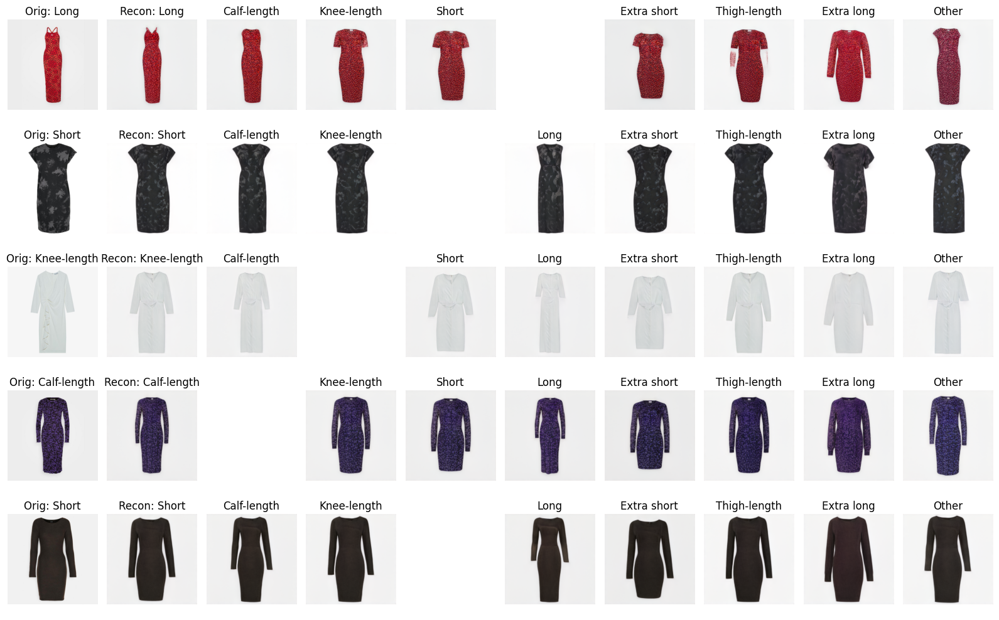

In [20]:
plot_attribute_changes('length')

### Shape

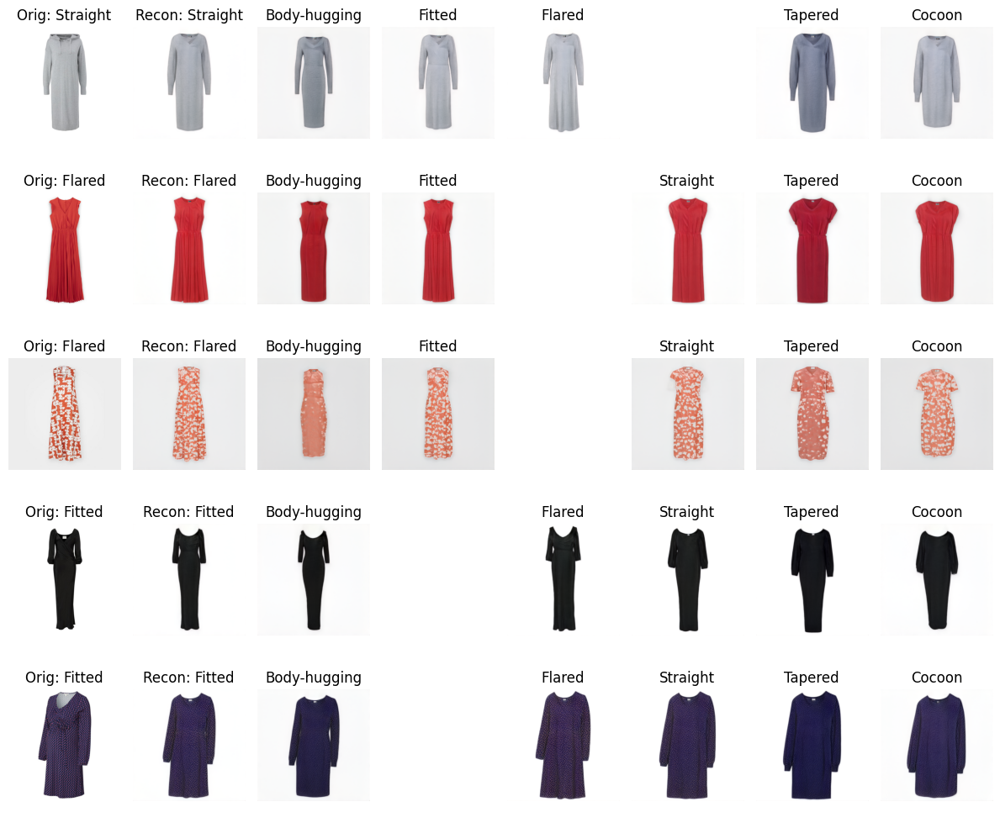

In [21]:
plot_attribute_changes('shape')

### Sleeve Length

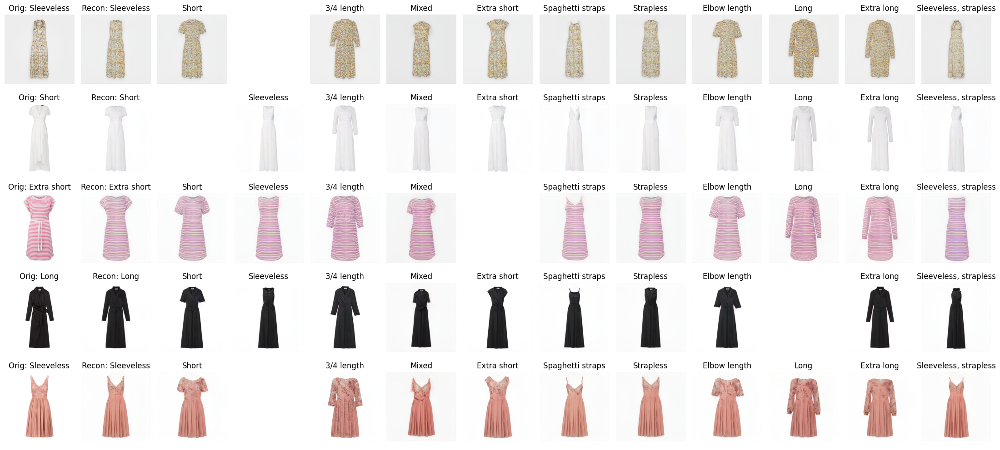

In [22]:
plot_attribute_changes('sleeve_length')

### Category

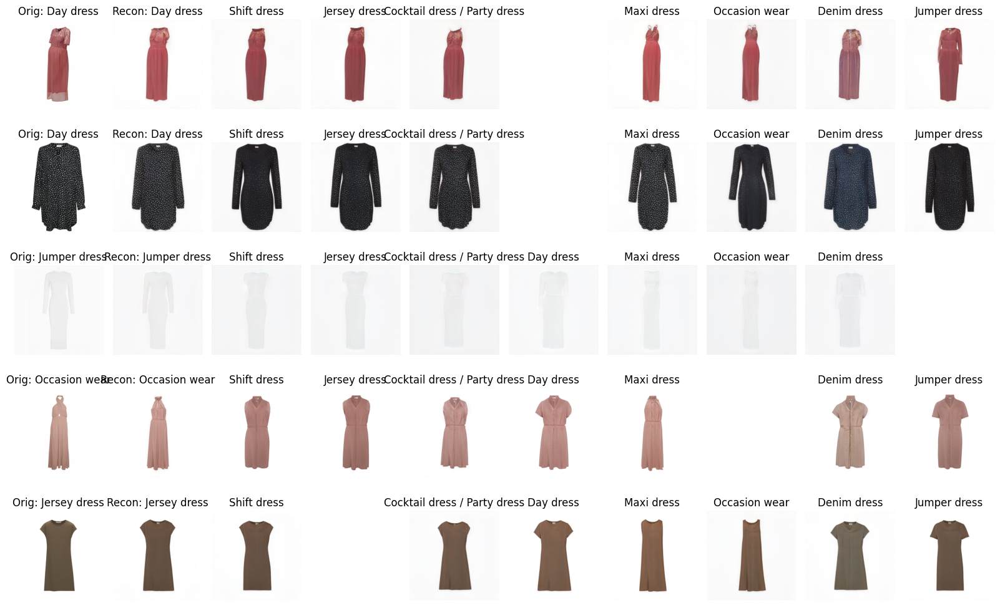

In [23]:
plot_attribute_changes('category')

### Brand
- To analyze brand properly, I subset the data to contain only the ten most common brands in the dataset.

In [24]:
# most_common_brands = list(metadata_df.brand.value_counts().head(10).index)
# metadata_df = metadata_df[metadata_df.brand.isin(most_common_brands)]

In [25]:
# plot_attribute_changes('brand')

### Test to Find "Global" Directions for Attribute "Color"

In [26]:
directions = get_directions('color')
directions_to_red = {k:v for k,v in directions.items() if k[1] == 'red'}
mean_direction = torch.stack(list(directions_to_red.values())).mean(dim=0)

In [27]:
def change_globally(attribute, target, alpha):
    # Get directions
    directions = get_directions(attribute)
    directions_to_target = {k:v for k,v in directions.items() if k[1] == target}
    mean_direction = torch.stack(list(directions_to_target.values())).mean(dim=0)

    # Plot manipulations
    fig, ax = plt.subplots(num_samples, 3, figsize=(8, num_samples*2))
    for sample in range(num_samples):
        sku = metadata_df[metadata_df[attribute] != target].sample(1).id.values[0]
        # Original Image
        img_orig = Image.open(f"{image_path}{sku}.jpg").resize([512, 512])
        ax[sample, 0].imshow(img_orig)
        ax[sample, 0].axis('off')
        ax[sample, 0].set_title(f"Orig: {metadata[sku][attribute]}")

        # Reconstruction
        img = generate_from_sku(sku)
        ax[sample, 1].imshow(img)
        ax[sample, 1].axis('off')
        ax[sample, 1].set_title(f"Recon: {metadata[sku][attribute]}")

        # Change Attribute
        latent = latents_dict[sku][0].unsqueeze(0).to(device)
        new_latent = latent + alpha * mean_direction
        img = generate_from_latent(new_latent)
        ax[sample, 2].imshow(img)
        ax[sample, 2].axis('off')
        ax[sample, 2].set_title(f'Change to {target}')
    fig.tight_layout()
    plt.show()


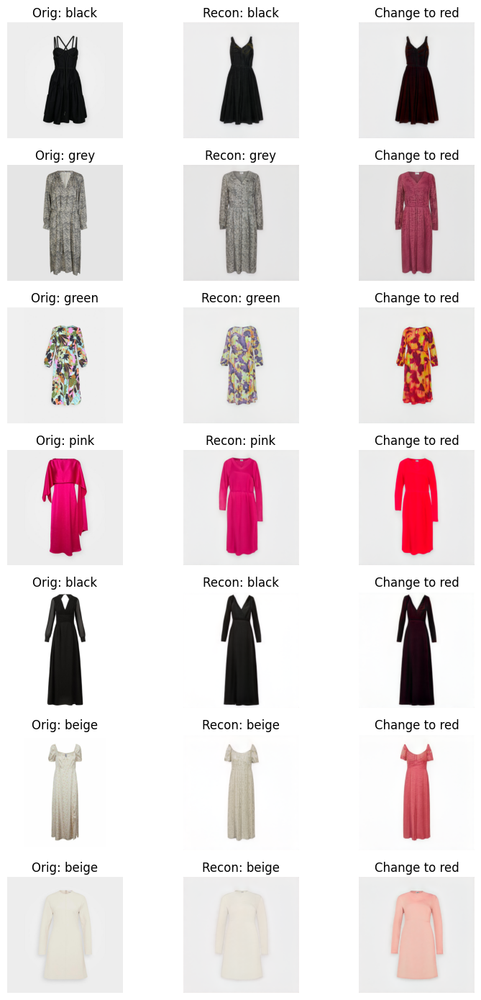

In [29]:
change_globally('color', 'red', 1)